In [1]:
import os
import sys

module_path = os.path.abspath(os.path.join('../..'))

if module_path not in sys.path:
    sys.path.append(module_path)

# Line Search Methods

To show the performance of line search methods we will test each of these over three different kinds of objective function:
- a convex *quadratic* function with not too much nicely conditioned, i.e., a bit elongated Hessian;
- the *Rosenbrock* function, a nonlinear function with one global minimum;
- the *Six-Hump Camel* function, a nonlinear function with six local minima, two of which are global.

In [2]:
import numpy as np

from optiml.opti import Quadratic

Q = [[5, -3], 
     [-3, 5]]
q = [10, 5]
quad = Quadratic(Q, q)

The optimal solution of the linear system:

$$ Qx = q $$

is:

$$ x^* = Q^{-1} q $$

In [3]:
np.linalg.inv(Q).dot(q)

array([4.0625, 3.4375])

In [4]:
from optiml.opti.unconstrained import Rosenbrock, SixHumpCamel

rosen = Rosenbrock()
shc = SixHumpCamel()

In [5]:
from optiml.opti.unconstrained.line_search import *
from optiml.opti.utils import plot_trajectory_optimization

## 0th Order Methods

### Subgradient

iter	 cost		 gnorm		 gap		 rate
   0	 3.0000e+00	 1.3153e+01	 3.1906e+01			astar:  1.2317e-01
  50	-2.6442e+01	 3.1400e+00	 2.4644e+00	 7.7239e-02	astar:  3.9698e-02
 100	-2.8714e+01	 8.7692e-01	 1.9225e-01	 7.8011e-02	astar:  1.0937e-02
 150	-2.8889e+01	 2.6337e-01	 1.7341e-02	 9.0201e-02	astar:  2.8021e-03
 200	-2.8902e+01	 1.2389e-01	 3.8373e-03	 2.2128e-01	astar:  4.5835e-04
 250	-2.8904e+01	 9.4222e-02	 2.2194e-03	 5.7839e-01	astar:  3.0677e-04
 300	-2.8905e+01	 5.5918e-02	 7.8170e-04	 3.5221e-01	astar:  5.1693e-04
 350	-2.8898e+01	 3.6679e-01	 8.4212e-03	 1.0773e+01	astar:  2.3038e-02
 400	-2.8904e+01	 1.9628e-01	 2.4080e-03	 2.8594e-01	astar:  1.2415e-02
 450	-2.8905e+01	 1.2157e-01	 9.2372e-04	 3.8361e-01	astar:  7.8359e-03
 500	-2.8906e+01	 1.4725e-02	 1.9055e-05	 2.0629e-02	astar:  3.2570e-03
 550	-2.8906e+01	 2.4325e-03	 3.6984e-07	 1.9409e-02	astar:  1.2034e-02
 600	-2.8906e+01	 2.2974e-03	 3.2988e-07	 8.9194e-01	astar:  1.2724e-02
 650	-2.8906e+01	 5.3031e-03	 1.7577e-06	 

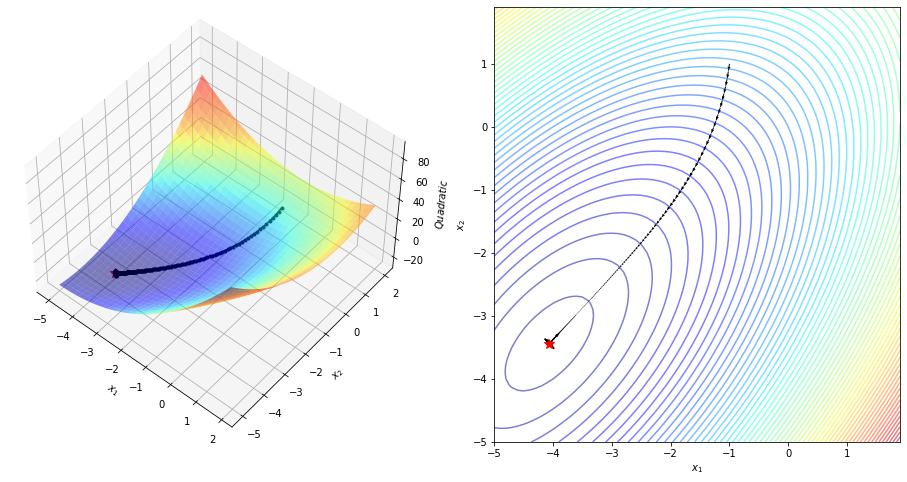

In [6]:
opt = Subgradient(f=quad, x=[-1, 1], a_start=0.54, verbose=50).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	 cost		 gnorm		 gap		 rate
   0	 4.0000e+00	 4.0000e+00	 4.0000e+00			astar:  5.2000e-02
  50	 2.6931e-01	 7.4982e-01	 2.6931e-01	 6.7328e-02	astar:  2.0885e-02
 100	 3.2878e-03	 3.4529e-01	 3.2878e-03	 1.2208e-02	astar:  1.2781e-02
 150	 3.0216e-03	 3.5743e-01	 3.0216e-03	 9.1904e-01	astar:  8.7064e-03
 200	 2.4962e-05	 3.2827e-02	 2.4962e-05	 8.2613e-03	astar:  9.7700e-04
 250	 1.8105e-06	 8.8525e-03	 1.8105e-06	 7.2531e-02	astar:  3.1739e-04
 300	 2.4768e-07	 3.2728e-03	 2.4768e-07	 1.3680e-01	astar:  3.8107e-04
 350	 3.1794e-07	 3.7082e-03	 3.1794e-07	 1.2837e+00	astar:  3.5527e-04
 400	 1.4893e-05	 2.5362e-02	 1.4893e-05	 4.6842e+01	astar:  6.2662e-04
 450	 4.5642e-07	 4.4441e-03	 4.5642e-07	 3.0647e-02	astar:  3.2760e-04
 500	 1.0542e-06	 6.7540e-03	 1.0542e-06	 2.3096e+00	astar:  3.0414e-04
 550	 8.7494e-07	 6.1458e-03	 8.7494e-07	 8.2999e-01	astar:  3.0508e-04
 600	 1.0175e-05	 2.0920e-02	 1.0175e-05	 1.1630e+01	astar:  5.3419e-04
 650	 5.1548e-07	 4.7230e-03	 5.1548e-07	 

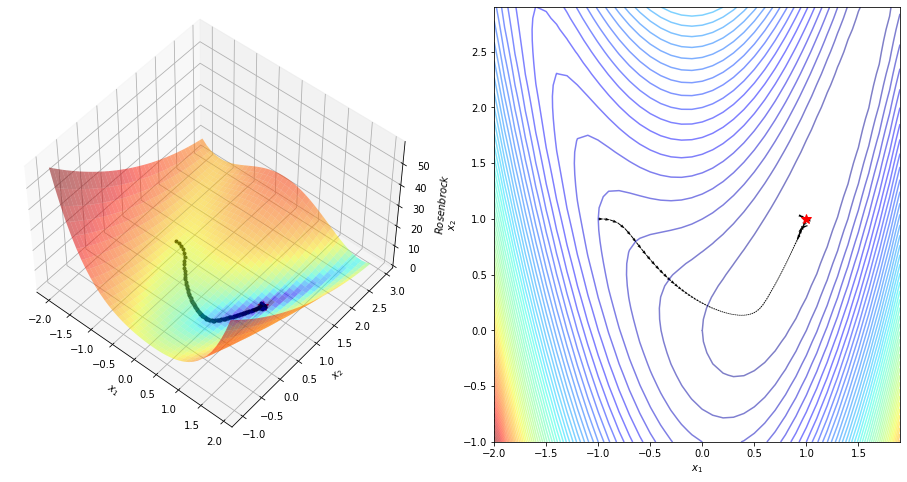

In [7]:
opt = Subgradient(f=rosen, x=[-1, 1], a_start=0.052, verbose=50).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	 cost		 gnorm		 gap		 rate
   0	 2.2333e+00	 1.8868e+00	 3.2650e+00			astar:  9.1142e-02
  50	-7.5491e-01	 2.3032e+00	 2.7672e-01	 8.4755e-02	astar:  5.8446e-03
 100	-1.0006e+00	 7.3768e-01	 3.1052e-02	 1.1221e-01	astar:  1.4041e-03
 150	-1.0196e+00	 4.4144e-01	 1.2058e-02	 3.8830e-01	astar:  1.8055e-04
 200	-1.0210e+00	 4.1210e-01	 1.0588e-02	 8.7810e-01	astar:  1.4881e-05
 250	-1.0212e+00	 4.0968e-01	 1.0470e-02	 9.8889e-01	astar:  2.4926e-06
 300	-1.0212e+00	 4.0863e-01	 1.0419e-02	 9.9512e-01	astar:  2.4991e-06
 350	-1.0213e+00	 4.0757e-01	 1.0368e-02	 9.9510e-01	astar:  2.5057e-06
 400	-1.0213e+00	 4.0651e-01	 1.0317e-02	 9.9507e-01	astar:  2.5124e-06
 450	-1.0214e+00	 4.0545e-01	 1.0266e-02	 9.9505e-01	astar:  2.5191e-06
 500	-1.0214e+00	 4.0439e-01	 1.0215e-02	 9.9503e-01	astar:  2.5258e-06
 550	-1.0215e+00	 4.0332e-01	 1.0164e-02	 9.9500e-01	astar:  2.5326e-06
 600	-1.0215e+00	 4.0225e-01	 1.0113e-02	 9.9497e-01	astar:  2.5395e-06
 650	-1.0216e+00	 4.0118e-01	 1.0062e-02	 

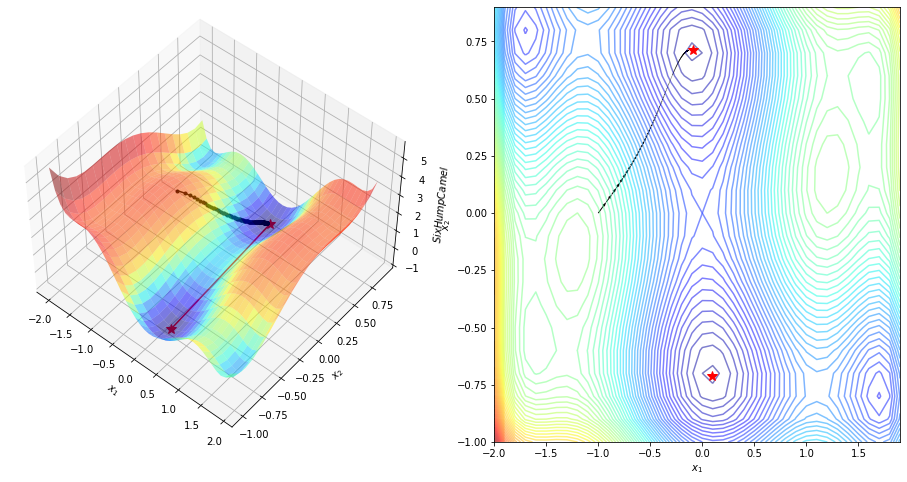

In [8]:
opt = Subgradient(f=shc, x=[-1, 0], a_start=0.077, verbose=50).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

## 1st Order Methods

### Steepest Gradient Descent

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01			ls:  1	it:  1	astar:  2.4401e-01
   5	  11	-2.8764e+01	 1.0521e+00	 1.4176e-01	 4.4432e-03	ls:  1	it:  1	astar:  1.6944e-01
  10	  21	-2.8906e+01	 5.8441e-02	 6.2988e-04	 4.4432e-03	ls:  1	it:  1	astar:  2.4401e-01
  15	  31	-2.8906e+01	 4.6747e-03	 2.7987e-06	 4.4432e-03	ls:  1	it:  1	astar:  1.6944e-01
  20	  41	-2.8906e+01	 2.5966e-04	 1.2435e-08	 4.4432e-03	ls:  1	it:  1	astar:  2.4401e-01
  25	  51	-2.8906e+01	 2.0770e-05	 5.5245e-11	 4.4427e-03	ls:  1	it:  1	astar:  1.6944e-01
  30	  61	-2.8906e+01	 1.1537e-06	 2.4158e-13	 4.3730e-03	ls:  1	it:  1	astar:  2.4401e-01

[-4.06249977 -3.43749989]


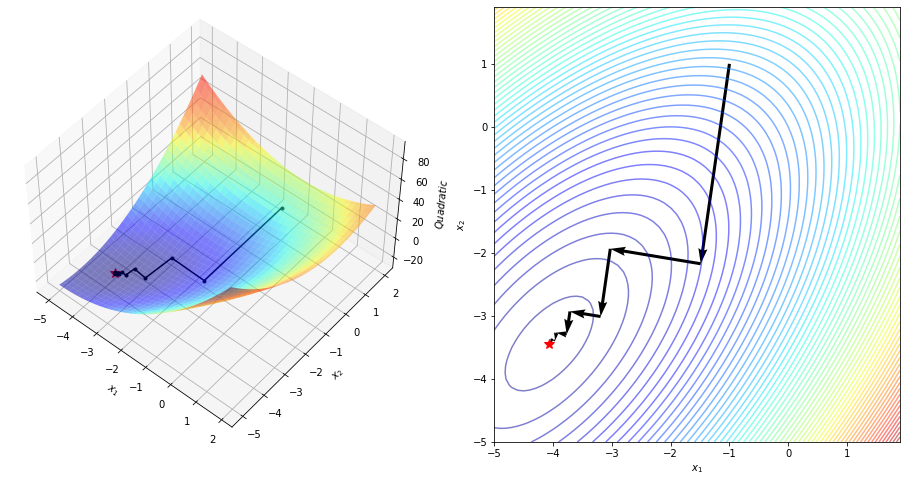

In [9]:
opt = SteepestGradientDescent(f=quad, x=[-1, 1], verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00			ls:  1	it:  1	astar:  2.0000e-02
  10	  24	 1.4069e-01	 7.8869e-01	 1.4069e-01	 3.5172e-02	ls:  1	it:  1	astar:  1.3544e-01
  20	  43	 9.6148e-03	 3.6070e-01	 9.6148e-03	 6.8342e-02	ls:  1	it:  1	astar:  7.2205e-02
  30	  60	 1.9204e-04	 2.4352e-02	 1.9204e-04	 1.9973e-02	ls:  1	it:  1	astar:  6.1560e-02
  40	  80	 8.0739e-05	 1.3164e-02	 8.0739e-05	 4.2044e-01	ls:  1	it:  1	astar:  7.0312e-02
  50	 100	 3.8126e-05	 8.2978e-03	 3.8126e-05	 4.7222e-01	ls:  1	it:  1	astar:  7.7335e-02
  60	 120	 1.8733e-05	 5.5144e-03	 1.8733e-05	 4.9135e-01	ls:  1	it:  1	astar:  8.3326e-02
  70	 140	 9.3507e-06	 3.7591e-03	 9.3507e-06	 4.9915e-01	ls:  1	it:  1	astar:  8.8386e-02
  80	 160	 4.6935e-06	 2.5980e-03	 4.6935e-06	 5.0194e-01	ls:  1	it:  1	astar:  9.2548e-02
  90	 180	 2.3582e-06	 1.8097e-03	 2.3582e-06	 5.0244e-01	ls:  1	it:  1	astar:  9.5870e-02
 100	 200	 1.1837e-06	 1.2665e-03	 1.1837e-06	 5.0197e-01	ls: 

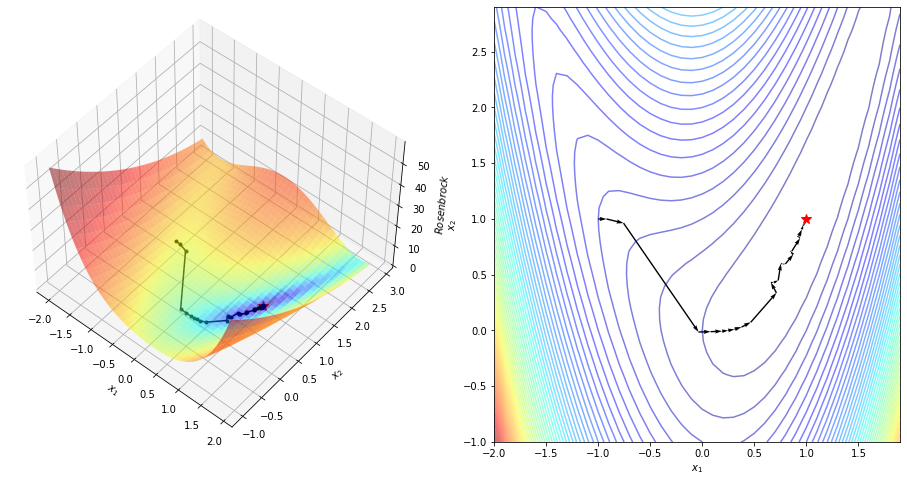

In [10]:
opt = SteepestGradientDescent(f=rosen, x=[-1, 1], verbose=10).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00			ls:  1	it:  3	astar:  5.8150e-01
   1	   5	-9.1635e-01	 1.5758e+00	 1.1528e-01	 3.5309e-02	ls:  1	it:  2	astar:  2.0777e-02
   2	   8	-9.6321e-01	 1.2775e+00	 6.8413e-02	 5.9345e-01	ls:  1	it:  1	astar:  1.3590e-02
   3	  10	-9.8383e-01	 1.0948e+00	 4.7798e-02	 6.9866e-01	ls:  1	it:  1	astar:  1.5862e-02
   4	  12	-1.0011e+00	 8.9463e-01	 3.0501e-02	 6.3812e-01	ls:  1	it:  1	astar:  1.9159e-02
   5	  14	-1.0146e+00	 6.8005e-01	 1.6983e-02	 5.5681e-01	ls:  1	it:  1	astar:  2.4138e-02
   6	  16	-1.0240e+00	 4.5943e-01	 7.6141e-03	 4.4834e-01	ls:  1	it:  1	astar:  3.1986e-02
   7	  18	-1.0292e+00	 2.5213e-01	 2.3839e-03	 3.1309e-01	ls:  1	it:  1	astar:  4.5108e-02
   8	  20	-1.0312e+00	 9.5287e-02	 4.3884e-04	 1.8409e-01	ls:  1	it:  1	astar:  7.5212e-02
   9	  22	-1.0316e+00	 3.2496e-02	 6.0648e-05	 1.3820e-01	ls:  1	it:  1	astar:  1.0530e-01
  10	  24	-1.0316e+00	 1.2409e-02	 5.6839e-06	 9.3720e-02	ls: 

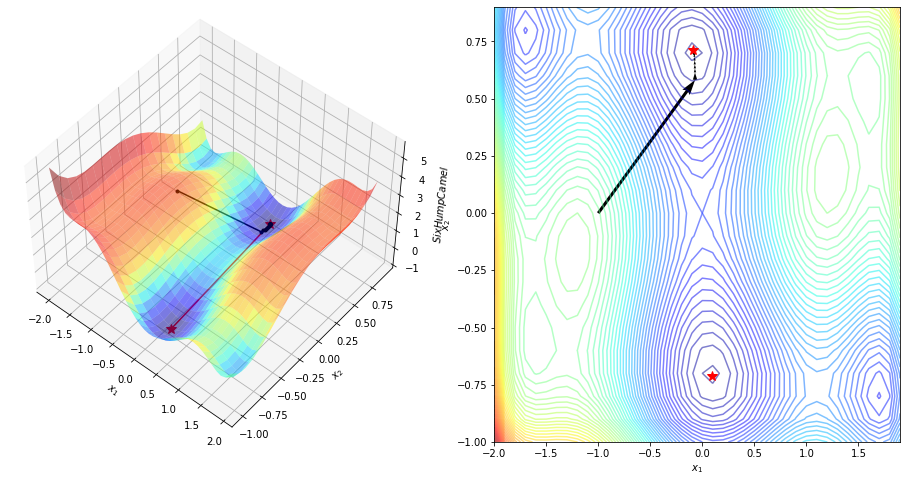

In [11]:
opt = SteepestGradientDescent(f=shc, x=[-1, 0], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

### Nonlinear Conjugate Gradient

#### Fletcher-Reeves formula

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01						ls:  1	it:  1	astar:  2.4401e-01
   1	   3	-1.8106e+01	 9.1829e+00	 1.0800e+01	 3.3848e-01	beta:  4.8744e-01	ls:  1	it:  1	astar:  2.5614e-01
   2	   5	-2.8906e+01	 0.0000e+00	-1.0658e-14	-9.8689e-16

[-4.0625 -3.4375]


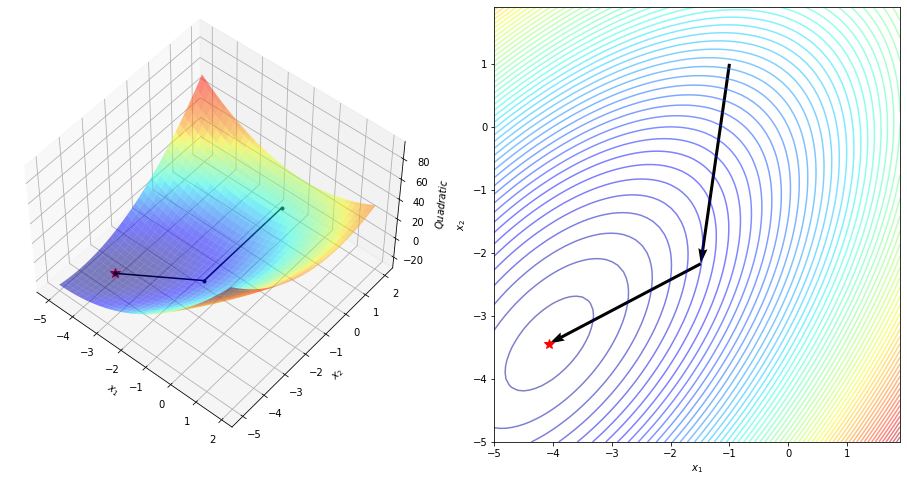

In [12]:
opt = NonlinearConjugateGradient(f=quad, x=[-1, 1], wf=0, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00						ls:  1	it:  1	astar:  2.0000e-02
   5	  31	 2.8968e-01	 1.3019e+00	 2.8968e-01	 7.2419e-02	beta:  4.4868e-01	ls:  1	it:  1	astar:  1.0000e-02
  10	  41	 1.8175e-01	 5.2523e-01	 1.8175e-01	 6.2743e-01	beta:  9.8681e-01	ls:  1	it:  1	astar:  1.0000e-02
  15	  51	 1.2203e-01	 1.1813e+00	 1.2203e-01	 6.7141e-01	beta:  1.5196e+00	ls:  1	it:  1	astar:  1.0000e-02
  20	  64	 7.5572e-02	 1.9254e+00	 7.5572e-02	 6.1929e-01	beta:  9.2945e-01	ls:  1	it:  2	astar:  4.3459e-03
  25	  79	 5.9316e-02	 4.2915e-01	 5.9316e-02	 7.8489e-01	beta:  4.6664e-01	ls:  1	it:  2	astar:  3.9875e-03
  30	  94	 5.8465e-02	 1.9939e-01	 5.8465e-02	 9.8567e-01	beta:  1.2659e+00	ls:  1	it:  2	astar:  7.2812e-03
  35	 107	 5.3899e-02	 1.0796e+00	 5.3899e-02	 9.2190e-01	beta:  1.9714e+00	ls:  1	it:  1	astar:  1.0000e-02
  40	 118	 2.1515e-02	 2.9726e-01	 2.1515e-02	 3.9916e-01	beta:  2.9121e-01	ls:  1	it:  2	astar:  2.1362e-03
  45	 

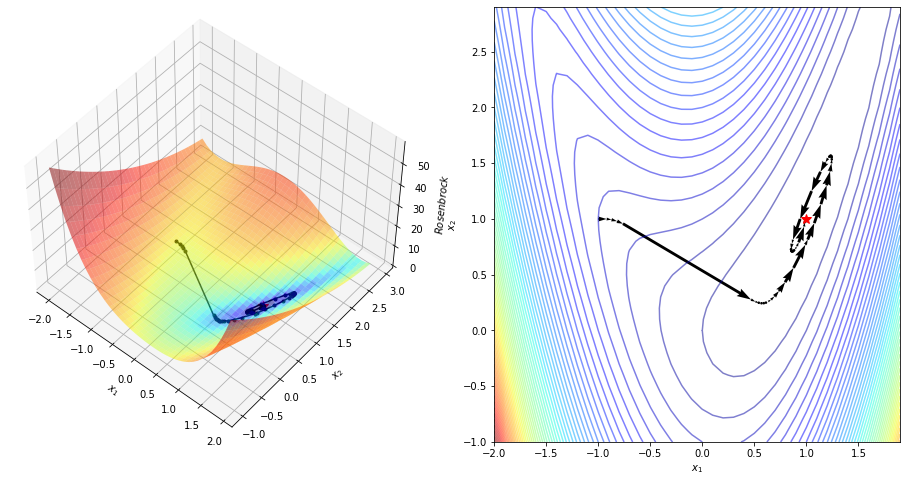

In [13]:
opt = NonlinearConjugateGradient(f=rosen, x=[-1, 1], wf=0, verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00						ls:  1	it:  3	astar:  5.8150e-01
  10	  23	-1.0308e+00	 1.6985e-01	 8.5587e-04	 2.6214e-04	beta:  9.9600e-01	ls:  1	it:  1	astar:  1.0000e-02
  20	  43	-1.0314e+00	 7.5113e-02	 2.7233e-04	 3.1819e-01	beta:  6.4080e-01	ls:  1	it:  1	astar:  1.0721e-02
  30	  63	-1.0316e+00	 2.8424e-02	 5.0266e-05	 1.8458e-01	beta:  9.4908e-01	ls:  1	it:  1	astar:  1.4613e-02
  40	  83	-1.0316e+00	 1.6213e-02	 9.6808e-06	 1.9259e-01	beta:  1.1289e+00	ls:  1	it:  1	astar:  1.4498e-02
  50	 103	-1.0316e+00	 7.3071e-03	 1.7005e-06	 1.7566e-01	beta:  7.4619e-01	ls:  1	it:  1	astar:  1.1546e-02
  60	 123	-1.0316e+00	 2.3942e-03	 2.9329e-07	 1.7247e-01	beta:  6.5313e-01	ls:  1	it:  1	astar:  1.2135e-02
  70	 143	-1.0316e+00	 1.0901e-03	 3.9155e-08	 1.3350e-01	beta:  9.9148e-01	ls:  1	it:  1	astar:  1.4967e-02
  80	 163	-1.0316e+00	 6.3567e-04	-1.7045e-08	-4.3533e-01	beta:  1.0826e+00	ls:  1	it:  1	astar:  1.3615e-02
  90	 

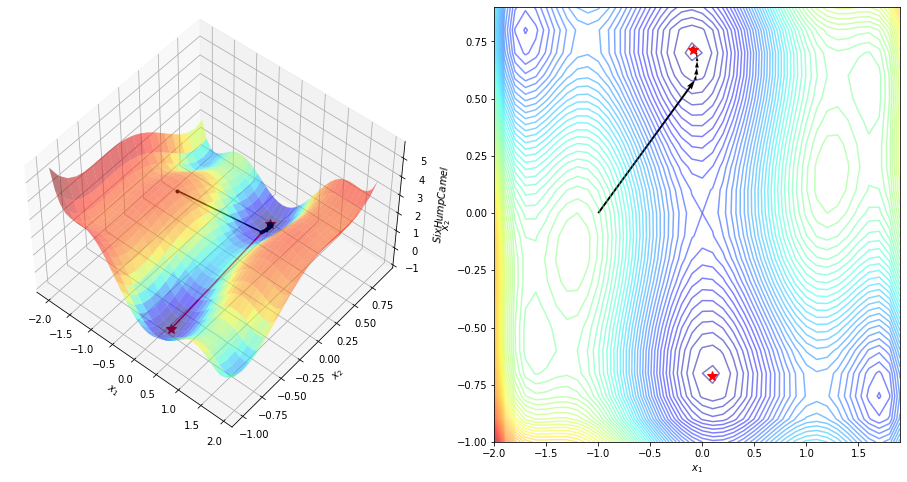

In [14]:
opt = NonlinearConjugateGradient(f=shc, x=[-1, 0], wf=0, verbose=10).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

#### Polak-Ribière formula

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01						ls:  1	it:  1	astar:  2.4401e-01
   1	   3	-1.8106e+01	 9.1829e+00	 1.0800e+01	 3.3848e-01	beta:  4.8744e-01	ls:  1	it:  1	astar:  2.5614e-01
   2	   5	-2.8906e+01	 0.0000e+00	-3.5527e-15	-3.2896e-16

[-4.0625 -3.4375]


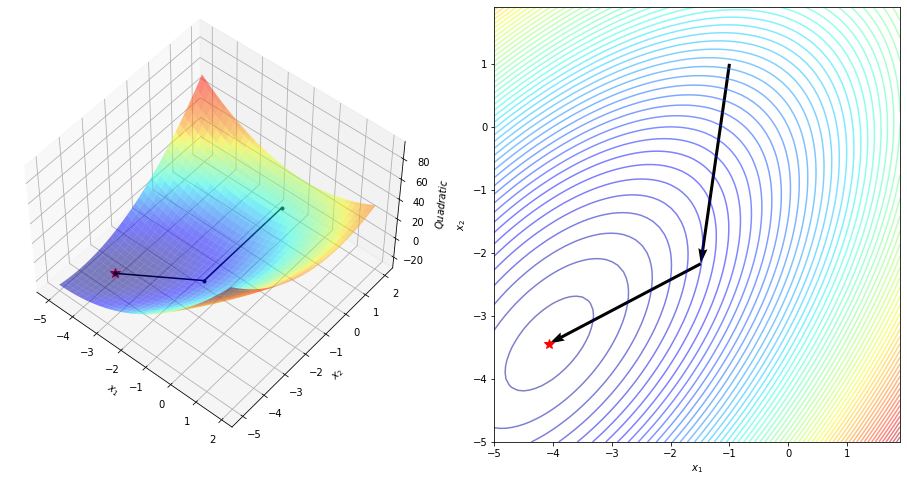

In [15]:
opt = NonlinearConjugateGradient(f=quad, x=[-1, 1], wf=1, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00						ls:  1	it:  1	astar:  2.0000e-02
   5	  15	 7.0010e-01	 1.6060e+00	 7.0010e-01	 1.7503e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  3.8536e-02
  10	  25	 1.4829e-01	 7.7794e-01	 1.4829e-01	 2.1181e-01	beta:  6.2352e-01	ls:  1	it:  1	astar:  1.5693e-01
  15	  34	 1.3598e-03	 9.1988e-02	 1.3598e-03	 9.1701e-03	beta:  1.5234e+00	ls:  1	it:  1	astar:  6.7634e-02
  20	  42	 3.0511e-06	 3.0443e-03	 3.0511e-06	 2.2438e-03	beta:  2.8986e+00	ls:  1	it:  0	astar:  1.0000e+00

[0.99909483 0.99815437]


/home/donato/Insync/donato.meoli.95@gmail.com/Google Drive/MachineLearning&ComputationalMathematics/optiml/optiml/opti/unconstrained/line_search/line_search.py:228: RuntimeWarning: divide by zero encountered in double_scalars
  a = (am * phi_ps - _as * phi_pm) / (phi_ps - phi_pm)


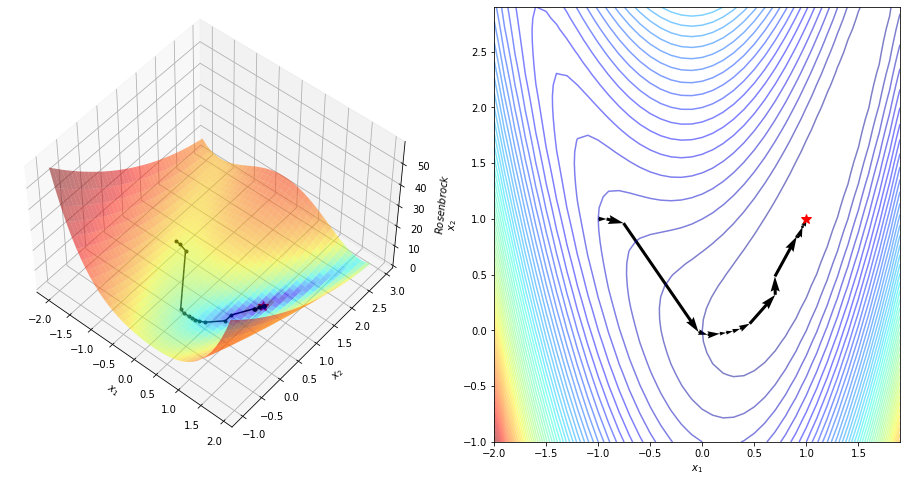

In [16]:
opt = NonlinearConjugateGradient(f=rosen, x=[-1, 1], wf=1, verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00						ls:  1	it:  3	astar:  5.8150e-01
   1	   5	-9.1635e-01	 1.5758e+00	 1.1528e-01	 3.5309e-02	beta:  2.6729e-01	ls:  1	it:  1	astar:  1.0000e-02
   2	   7	-9.4368e-01	 1.4124e+00	 8.7949e-02	 7.6291e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  1.2288e-02
   3	   9	-9.6676e-01	 1.2448e+00	 6.4865e-02	 7.3753e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  1.4026e-02
   4	  11	-9.8690e-01	 1.0590e+00	 4.4728e-02	 6.8955e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  1.6486e-02
   5	  13	-1.0036e+00	 8.5579e-01	 2.7988e-02	 6.2574e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  2.0101e-02
   6	  15	-1.0165e+00	 6.3880e-01	 1.5111e-02	 5.3992e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  2.5652e-02
   7	  17	-1.0252e+00	 4.1798e-01	 6.4397e-03	 4.2615e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  3.4634e-02
   8	  19	-1.0298e+00	 2.1588e-01	 1.8586e-03	 2.8861e-01	beta:  0.0000e+00	ls:  1	it:  1	astar:  5.0707e-02
   9	 

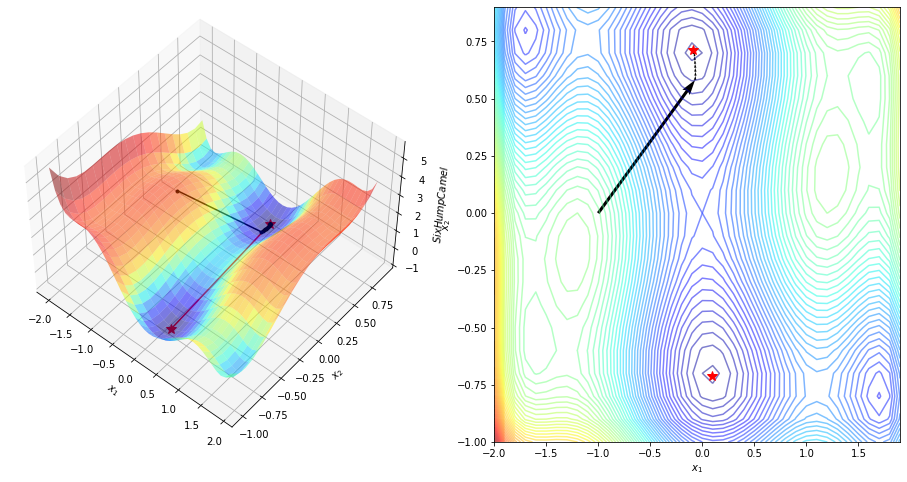

In [17]:
opt = NonlinearConjugateGradient(f=shc, x=[-1, 0], wf=1, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

#### Hestenes-Stiefel formula

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01						ls:  1	it:  1	astar:  2.4401e-01
   1	   3	-1.8106e+01	 9.1829e+00	 1.0800e+01	 3.3848e-01	beta:  4.8744e-01	ls:  1	it:  1	astar:  2.5614e-01
   2	   5	-2.8906e+01	 0.0000e+00	-3.5527e-15	-3.2896e-16

[-4.0625 -3.4375]


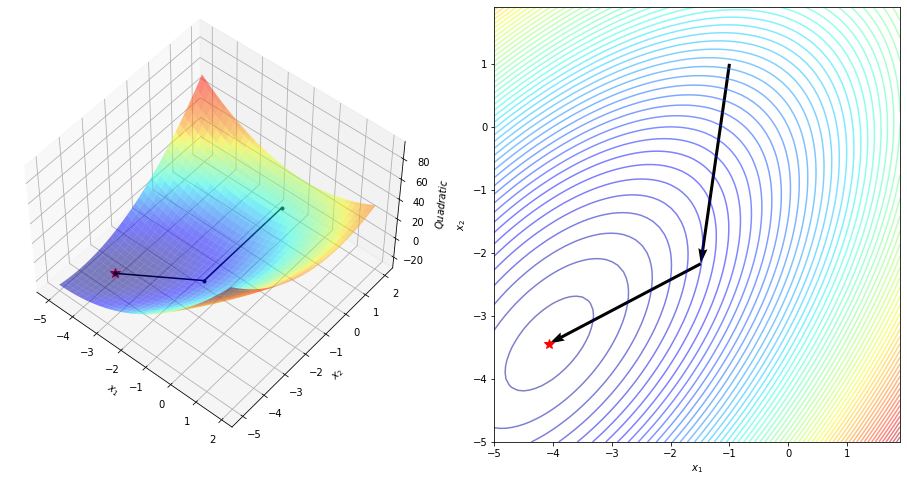

In [18]:
opt = NonlinearConjugateGradient(f=quad, x=[-1, 1], wf=2, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00						ls:  1	it:  1	astar:  2.0000e-02
   5	  10	 1.4668e+00	 2.3990e+00	 1.4668e+00	 3.6669e-01	beta: -7.7885e-01	ls:  1	it:  0	astar:  1.0000e+00
  10	  17	 7.7104e-01	 1.6627e+00	 7.7104e-01	 5.2568e-01	(res)			ls:  1	it:  1	astar:  4.7428e-02
  15	  25	 3.8825e-01	 1.2009e+00	 3.8825e-01	 5.0355e-01	beta: -8.0205e-01	ls:  1	it:  0	astar:  1.0000e+00
  20	  32	 8.3886e-02	 5.8252e-01	 8.3886e-02	 2.1606e-01	(res)			ls:  1	it:  1	astar:  4.3884e-02
  25	  39	 2.3670e-03	 4.7555e-02	 2.3670e-03	 2.8217e-02	beta: -4.0532e-01	ls:  1	it:  1	astar:  1.1195e-01
  30	  47	 9.9184e-05	 1.0755e-02	 9.9184e-05	 4.1902e-02	(res)			ls:  1	it:  1	astar:  1.1645e-01
  35	  55	 1.0606e-07	 7.0524e-04	 1.0606e-07	 1.0693e-03	beta:  4.7640e+00	ls:  1	it:  1	astar:  4.2650e-01

[0.99999998 0.99999985]


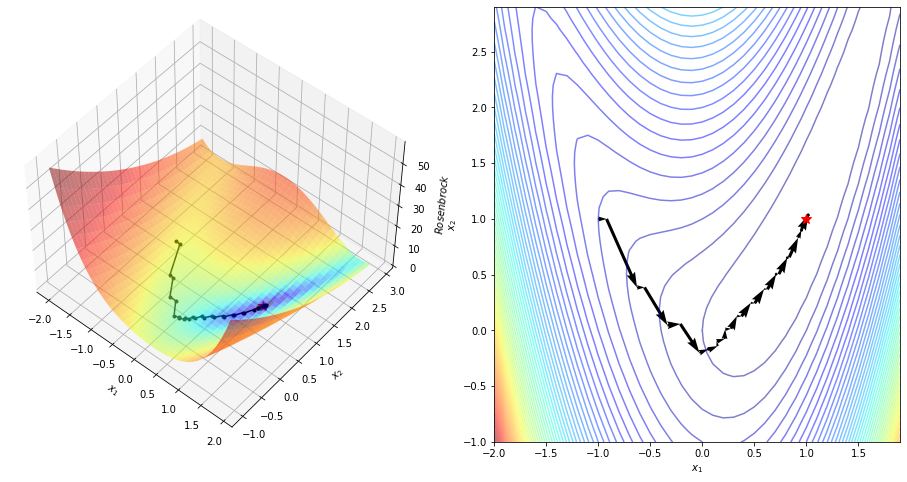

In [6]:
opt = NonlinearConjugateGradient(f=rosen, x=[-1, 1], wf=2, r_start=1, verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00						ls:  1	it:  3	astar:  5.8150e-01
   1	   5	-9.1635e-01	 1.5758e+00	 1.1528e-01	 3.5309e-02	beta:  4.6912e-01	ls:  1	it:  1	astar:  1.0000e-02
   2	   7	-9.4621e-01	 1.3922e+00	 8.5420e-02	 7.4097e-01	beta: -5.7376e-01	ls:  1	it:  1	astar:  1.8555e-01
   3	   9	-9.7137e-01	 1.2182e+00	 6.0258e-02	 7.0544e-01	beta:  1.6384e-01	ls:  1	it:  1	astar:  1.8101e-02
   4	  11	-9.9509e-01	 9.5333e-01	 3.6541e-02	 6.0640e-01	beta: -7.7095e-01	ls:  1	it:  1	astar:  2.3680e-01
   5	  13	-9.9821e-01	 9.5181e-01	 3.3419e-02	 9.1456e-01	beta:  8.3853e-01	ls:  1	it:  1	astar:  2.2326e-02
   6	  15	-1.0155e+00	 6.7579e-01	 1.6079e-02	 4.8115e-01	beta: -7.1026e-01	ls:  1	it:  9	astar:  1.0000e-18

[-0.1135345  0.6717522]


/home/donato/Insync/donato.meoli.95@gmail.com/Google Drive/MachineLearning&ComputationalMathematics/optiml/optiml/opti/unconstrained/line_search/line_search.py:228: RuntimeWarning: divide by zero encountered in double_scalars
  a = (am * phi_ps - _as * phi_pm) / (phi_ps - phi_pm)


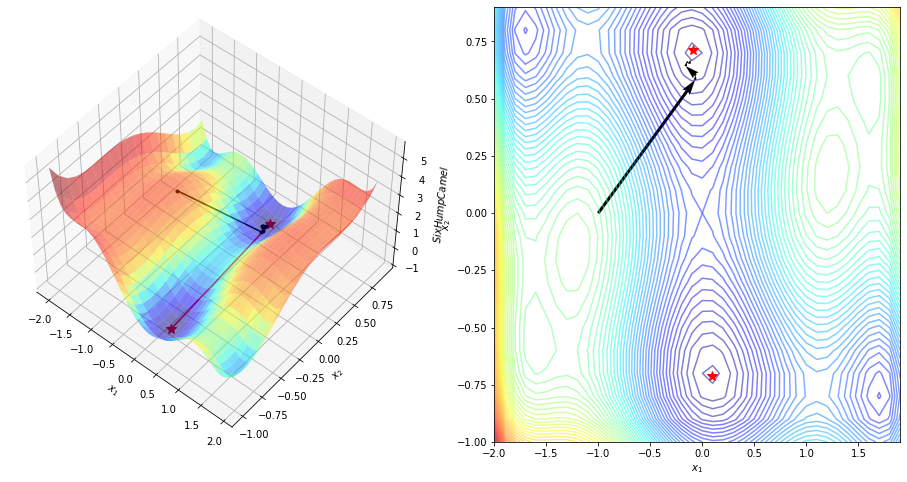

In [20]:
opt = NonlinearConjugateGradient(f=shc, x=[-1, 0], wf=2, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

#### Dai-Yuan formula

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01						ls:  1	it:  1	astar:  2.4401e-01
   1	   3	-1.8106e+01	 9.1829e+00	 1.0800e+01	 3.3848e-01	beta:  4.8744e-01	ls:  1	it:  1	astar:  2.5614e-01
   2	   5	-2.8906e+01	 0.0000e+00	-1.0658e-14	-9.8689e-16

[-4.0625 -3.4375]


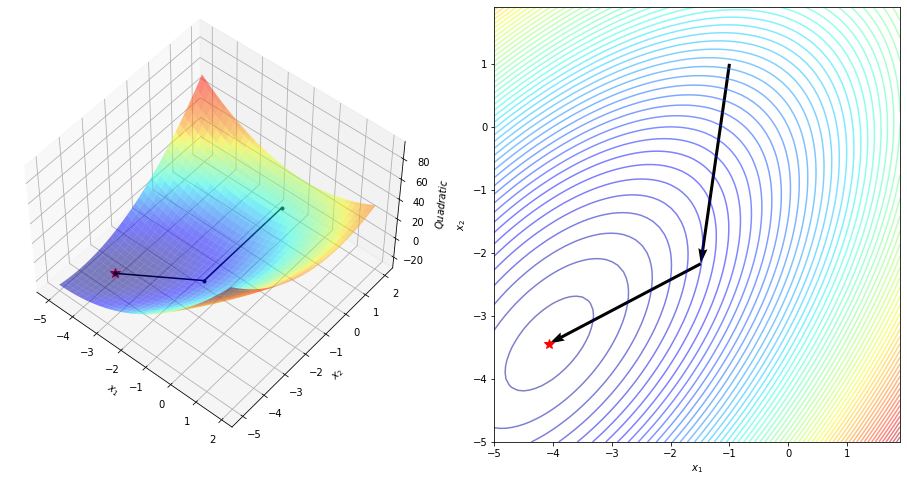

In [21]:
opt = NonlinearConjugateGradient(f=quad, x=[-1, 1], wf=3, verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00						ls:  1	it:  1	astar:  2.0000e-02
   5	  19	 2.3544e-01	 1.2992e+00	 2.3544e-01	 5.8860e-02	beta:  4.8081e-01	ls:  1	it:  1	astar:  1.0000e-02
  10	  29	 1.3264e-01	 4.9573e-01	 1.3264e-01	 5.6338e-01	beta:  1.2434e+00	ls:  1	it:  1	astar:  1.0000e-02
  15	  39	 6.0939e-02	 9.7472e-01	 6.0939e-02	 4.5942e-01	beta:  1.0711e+00	ls:  1	it:  1	astar:  1.0000e-02
  20	  50	 2.1500e-04	 1.7105e-02	 2.1500e-04	 3.5281e-03	beta:  7.6030e-01	ls:  1	it:  0	astar:  1.0000e+00
  25	  59	 1.3251e-06	 4.6609e-03	 1.3251e-06	 6.1631e-03	beta:  7.4769e-01	ls:  1	it:  1	astar:  8.6341e-02
  30	  69	 1.7606e-08	 3.5980e-04	 1.7606e-08	 1.3287e-02	beta:  1.1168e-01	ls:  1	it:  1	astar:  8.1782e-02
  35	  79	 5.3574e-10	 3.4359e-05	 5.3574e-10	 3.0430e-02	beta:  1.5272e-01	ls:  1	it:  1	astar:  1.5571e-01
  40	  89	 1.9545e-11	 7.1718e-06	 1.9545e-11	 3.6482e-02	beta:  8.7729e-01	ls:  1	it:  1	astar:  3.5123e-01
  45	 

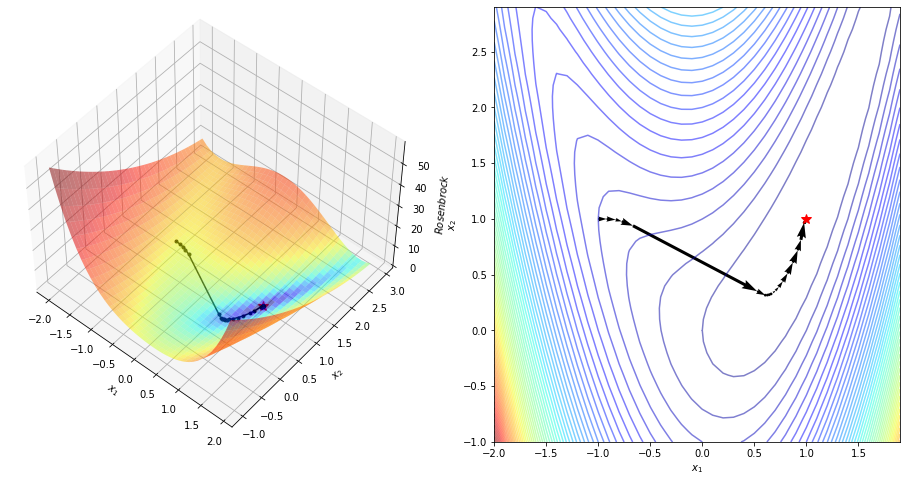

In [22]:
opt = NonlinearConjugateGradient(f=rosen, x=[-1, 1], wf=3, verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00						ls:  1	it:  3	astar:  5.8150e-01
  10	  23	-1.0298e+00	 2.3802e-01	 1.7898e-03	 5.4818e-04	beta:  9.5752e-01	ls:  1	it:  1	astar:  2.9100e-02
  20	  43	-1.0316e+00	 1.8857e-02	 1.0789e-05	 6.0281e-03	beta:  6.8356e-01	ls:  1	it:  1	astar:  2.9118e-02
  30	  63	-1.0316e+00	 1.1734e-03	 2.0789e-08	 1.9268e-03	beta:  4.0455e-01	ls:  1	it:  1	astar:  2.7777e-02
  40	  83	-1.0316e+00	 7.1755e-05	-3.0275e-08	-1.4563e+00	beta:  3.6786e-01	ls:  1	it:  1	astar:  3.2336e-02
  50	 103	-1.0316e+00	 5.2708e-06	-3.0560e-08	 1.0094e+00	beta:  5.5196e-01	ls:  1	it:  1	astar:  4.1853e-02

[-0.08984195  0.71265636]


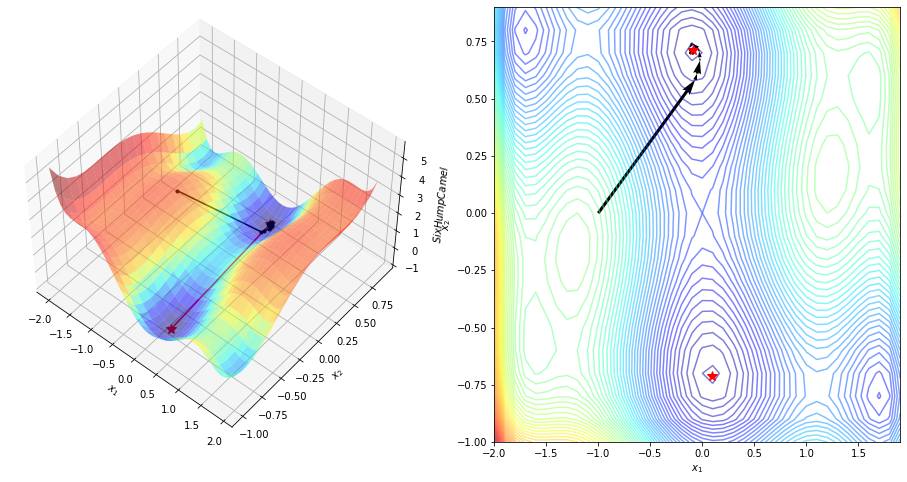

In [23]:
opt = NonlinearConjugateGradient(f=shc, x=[-1, 0], wf=3, verbose=10).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

### Heavy Ball Gradient

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01			ls:  1	it:  1	astar:  2.4401e-01
   5	  11	-2.8906e+01	 5.4588e-02	 7.2510e-04	 2.2726e-05	ls:  1	it:  1	astar:  1.2411e-01
  10	  22	-2.8906e+01	 1.2902e-04	 1.3558e-09	 1.8698e-06	ls:  1	it:  1	astar:  1.3629e-01

[-4.06249979 -3.43749971]


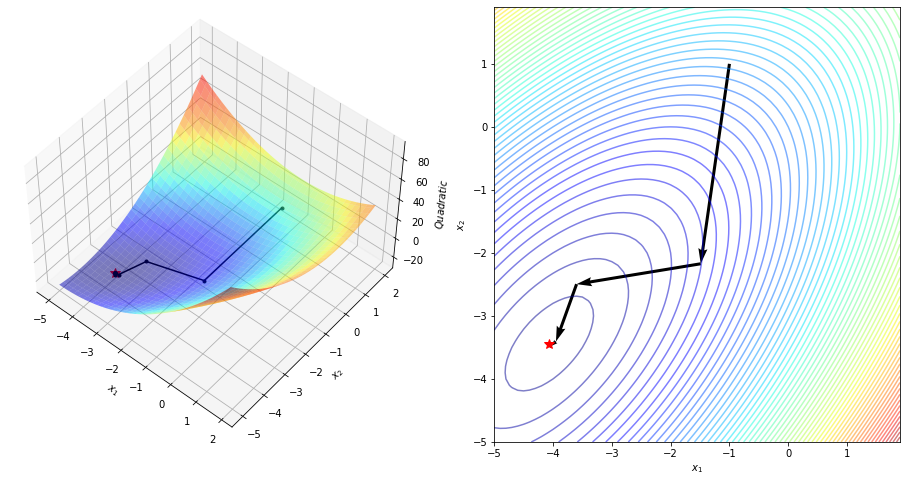

In [24]:
opt = HeavyBallGradient(f=quad, x=[-1, 1], verbose=5).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00			ls:  1	it:  1	astar:  2.0000e-02
  10	  25	 3.3399e-03	 3.6448e-01	 3.3399e-03	 8.3498e-04	ls:  1	it:  1	astar:  3.2972e-02
  20	  42	 2.3519e-06	 1.9096e-03	 2.3519e-06	 7.0419e-04	ls:  1	it:  1	astar:  1.0399e-01
  30	  62	 1.0240e-06	 1.2355e-03	 1.0240e-06	 4.3538e-01	ls:  1	it:  1	astar:  1.0703e-01
  40	  82	 4.4557e-07	 8.0780e-04	 4.4557e-07	 4.3513e-01	ls:  1	it:  1	astar:  1.0917e-01
  50	 102	 1.9354e-07	 5.2928e-04	 1.9354e-07	 4.3436e-01	ls:  1	it:  1	astar:  1.1066e-01
  60	 122	 8.3941e-08	 3.4723e-04	 8.3941e-08	 4.3372e-01	ls:  1	it:  1	astar:  1.1168e-01
  70	 142	 3.6367e-08	 2.2797e-04	 3.6367e-08	 4.3324e-01	ls:  1	it:  1	astar:  1.1236e-01
  80	 162	 1.5744e-08	 1.4974e-04	 1.5744e-08	 4.3291e-01	ls:  1	it:  1	astar:  1.1282e-01
  90	 182	 6.8118e-09	 9.8391e-05	 6.8118e-09	 4.3267e-01	ls:  1	it:  1	astar:  1.1313e-01
 100	 202	 2.9462e-09	 6.4661e-05	 2.9462e-09	 4.3252e-01	ls: 

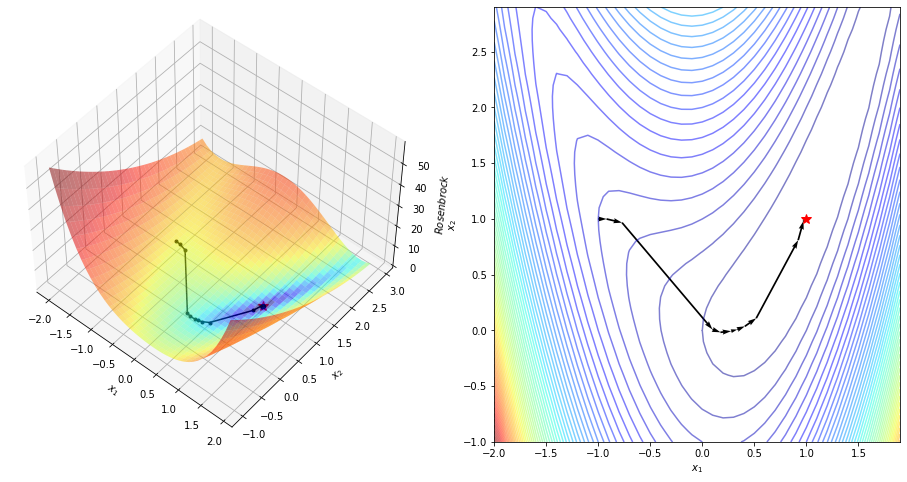

In [25]:
opt = HeavyBallGradient(f=rosen, x=[-1, 1], verbose=10).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

## 2nd Order Methods

### Newton

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 3.0000e+00	 1.3153e+01	 3.1906e+01			delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   1	   2	-2.8906e+01	 0.0000e+00	-3.5527e-15	-1.1135e-16

[-4.0625 -3.4375]


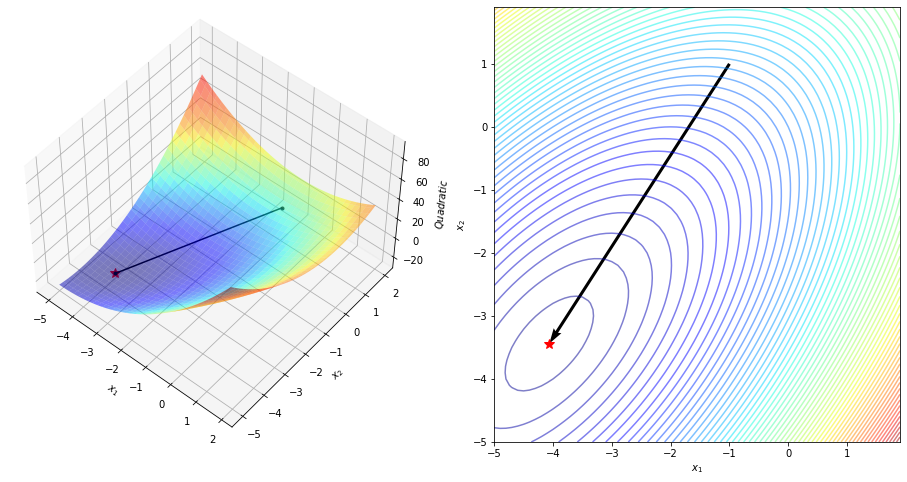

In [26]:
opt = Newton(f=quad, x=[-1, 1], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00			delta:  1.0000e-06	ls:  1	it:  2	astar:  1.1094e-01
   1	   4	 3.1666e+00	 3.8677e+00	 3.1666e+00	 7.9164e-01	delta:  1.0000e-06	ls:  1	it:  1	astar:  1.2322e-01
   2	   6	 2.5560e+00	 3.5683e+00	 2.5560e+00	 8.0718e-01	delta:  1.0000e-06	ls:  1	it:  1	astar:  1.9290e-01
   3	   8	 1.8760e+00	 3.0925e+00	 1.8760e+00	 7.3397e-01	delta:  1.0000e-06	ls:  1	it:  1	astar:  3.5560e-01
   4	  10	 1.1297e+00	 2.2308e+00	 1.1297e+00	 6.0215e-01	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   5	  11	 4.3941e-01	 1.5815e+00	 4.3941e-01	 3.8897e-01	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   6	  12	 6.7464e-02	 3.4182e-01	 6.7464e-02	 1.5353e-01	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   7	  13	 6.0875e-03	 3.9380e-01	 6.0875e-03	 9.0232e-02	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   8	  14	 2.6022e-05	 5.7622e-03	 2.6022e-05	 4.2746e-03	delta:  1.0000e-06	ls:  1	it:  0	a

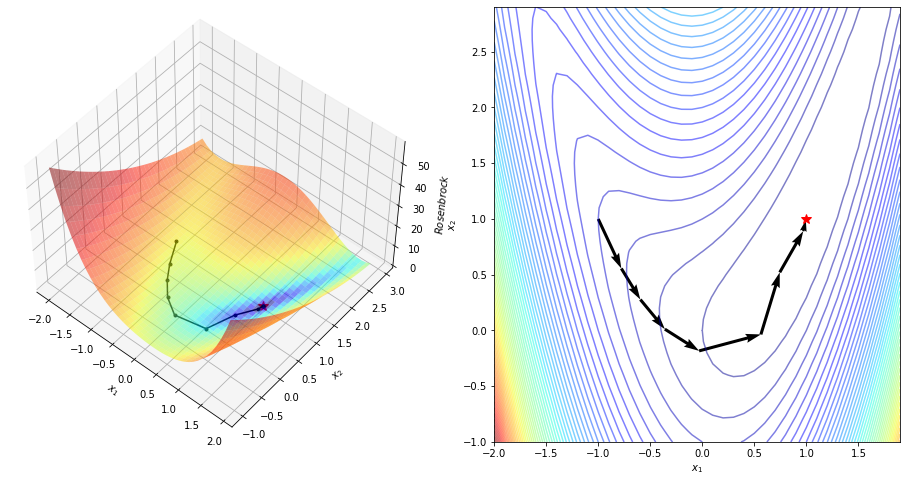

In [27]:
opt = Newton(f=rosen, x=[-1, 1], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00			delta:  8.6770e+00	ls:  1	it: 19	astar:  1.4192e-05
   1	  21	 1.9447e-01	 4.4419e+00	 1.2261e+00	 3.7553e-01	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   2	  22	-1.1927e-01	 2.3722e+00	 9.1236e-01	 7.4411e-01	delta:  1.0228e+00	ls:  1	it:  5	astar:  2.3876e-07
   3	  28	-1.0306e+00	 1.8655e-01	 1.0250e-03	 1.1234e-03	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   4	  29	-1.0316e+00	 4.0490e-03	 4.7352e-07	 4.6199e-04	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   5	  30	-1.0316e+00	 2.1198e-06	-3.0562e-08	-6.4542e-02	delta:  1.0000e-06	ls:  1	it:  0	astar:  1.0000e+00
   6	  31	-1.0316e+00	 5.8266e-13	-3.0562e-08	 1.0000e+00

[ 0.08984201 -0.7126564 ]


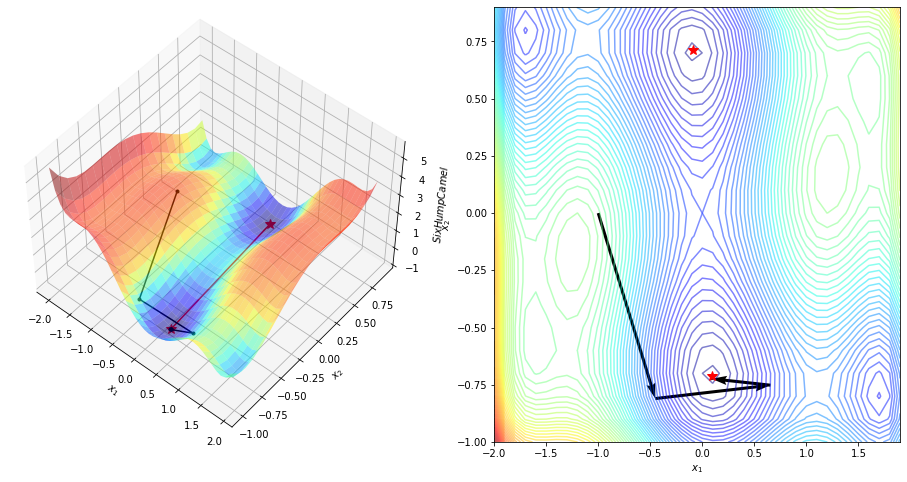

In [28]:
opt = Newton(f=shc, x=[-1, 0], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)

### BFGS

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 1.7000e+01	 1.3892e+01	 4.5906e+01			ls:  1	it:  1	astar:  4.1866e-01	rho:  1.2376e-02
   1	   3	-2.3400e+01	 8.5886e+00	 5.5060e+00	 1.1994e-01	ls:  1	it:  1	astar:  1.4929e-01	rho:  9.0809e-02
   2	   5	-2.8906e+01	 0.0000e+00	-3.5527e-15	-6.4524e-16

[-4.0625 -3.4375]


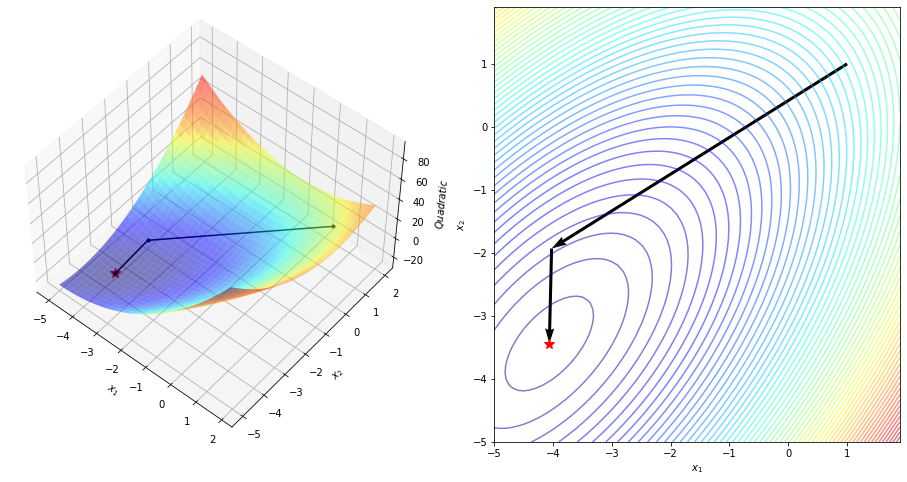

In [29]:
opt = BFGS(f=quad, x=[1, 1], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(quad, opt, x_min=-5, x_max=2, y_min=-5, y_max=2)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 4.0000e+00	 4.0000e+00	 4.0000e+00			ls:  1	it:  1	astar:  2.0000e-02	rho:  9.6862e+00
   1	   3	 3.7336e+00	 2.7783e+00	 3.7336e+00	 9.3340e-01	ls:  1	it:  1	astar:  3.8616e-01	rho:  3.1745e+00
   2	   5	 2.2653e+00	 2.9717e+00	 2.2653e+00	 6.0673e-01	ls:  1	it:  2	astar:  5.7832e-02	rho:  1.8723e+01
   3	   8	 1.9327e+00	 2.9884e+00	 1.9327e+00	 8.5317e-01	ls:  1	it:  1	astar:  2.1912e-01	rho:  6.0276e+00
   4	  10	 1.4771e+00	 2.7396e+00	 1.4771e+00	 7.6429e-01	ls:  1	it:  1	astar:  4.4112e-01	rho:  3.0697e+00
   5	  12	 1.0980e+00	 2.1668e+00	 1.0980e+00	 7.4335e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  3.4975e+00
   6	  13	 7.7830e-01	 1.5901e+00	 7.7830e-01	 7.0883e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  3.5447e+00
   7	  14	 3.4279e-01	 8.4908e-01	 3.4279e-01	 4.4044e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  5.2482e+00
   8	  15	 1.0901e-01	 3.7674e-01	 1.0901e-01	 3.1800e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  7.4794e+00


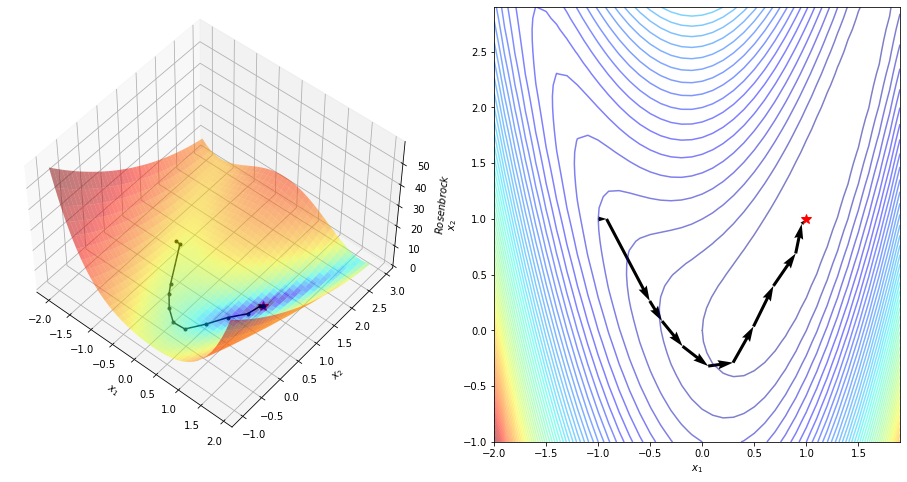

In [30]:
opt = BFGS(f=rosen, x=[-1, 1], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(rosen, opt, x_min=-2, x_max=2, y_min=-1, y_max=3)

iter	feval	 cost		 gnorm		 gap		 rate
   0	   1	 2.2333e+00	 1.8868e+00	 3.2650e+00			ls:  1	it:  3	astar:  5.8150e-01	rho:  8.4782e-01
   1	   5	-9.1635e-01	 1.5758e+00	 1.1528e-01	 3.5309e-02	ls:  1	it:  1	astar:  1.0000e-02	rho:  5.0300e+01
   2	   7	-9.6964e-01	 1.1991e+00	 6.1988e-02	 5.3771e-01	ls:  1	it:  1	astar:  3.5046e-01	rho:  1.3565e+01
   3	   9	-1.0252e+00	 4.3057e-01	 6.4011e-03	 1.0326e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  3.5279e+01
   4	  10	-1.0301e+00	 2.1808e-01	 1.5626e-03	 2.4411e-01	ls:  1	it:  0	astar:  1.0000e+00	rho:  2.9616e+02
   5	  11	-1.0316e+00	 9.1501e-03	 2.5116e-06	 1.6073e-03	ls:  1	it:  0	astar:  1.0000e+00	rho:  1.9512e+05
   6	  12	-1.0316e+00	 3.3762e-04	-2.3176e-08	-9.2275e-03	ls:  1	it:  0	astar:  1.0000e+00	rho:  5.3915e+07
   7	  13	-1.0316e+00	 4.0834e-05	-3.0453e-08	 1.3140e+00	ls:  1	it:  0	astar:  1.0000e+00	rho:  4.6156e+09
   8	  14	-1.0316e+00	 1.1996e-08	-3.0562e-08	 1.0036e+00

[-0.08984201  0.7126564 ]


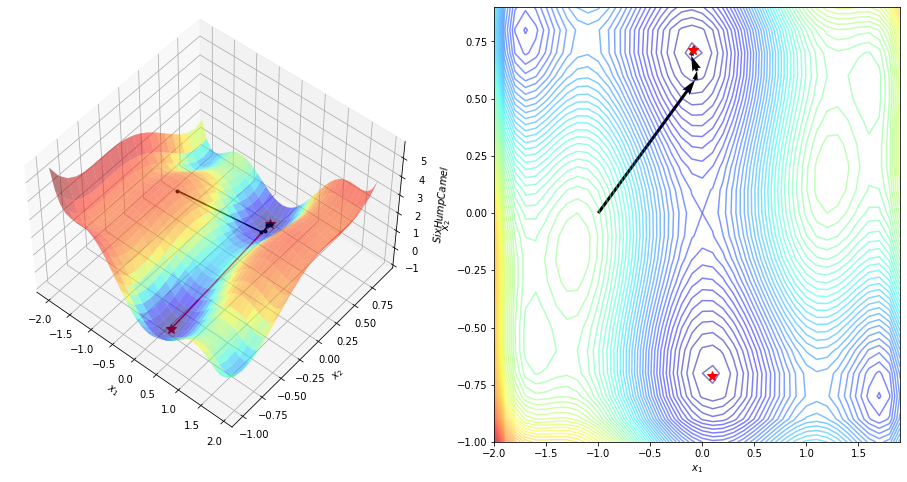

In [31]:
opt = BFGS(f=shc, x=[-1, 0], verbose=True).minimize()
print(opt.x)
plot_trajectory_optimization(shc, opt, x_min=-2, x_max=2, y_min=-1, y_max=1)